# Importing Libraries
Importing all the relevant libraries and installing torchinfo to get summary of Models

In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix

In [2]:
!pip install -q torchinfo
from torchinfo import summary

# Walking through Data Directory
Creating a function which walks through the directory.

Input- Data directory

Output- List of all the image folders present in the input directory

1. We get the directory paths, directory names and file names using the `os.walk()` method
2. We calculate the no. of files using `len(filenames)`
3. If the no. of files in a directory is not equal to zero, we append that directory path in the output list

In [3]:
data_dir = "/kaggle/input/animal-image-dataset-90-different-animals/animals/animals"

In [4]:
def walk_through_dir(dir_path):
    image_folders_dir = []
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'")
        if len(filenames) != 0:
            image_folders_dir.append(dirpath)
    return image_folders_dir

In [5]:
image_folders_dir = walk_through_dir(data_dir)

There are 90 directories and 0 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/beetle'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/parrot'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/fox'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/wolf'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/hedgehog'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/turtle'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/snake'
There are 0 directories and 60 imag

# Visualizing Random Images
In this section we visualize random images using the following techniques:
1. Using Pillow Library
2. Using Matplotlib

### Using Pillow Library
Here we create a function to display a random image from any random directory
1. We get a random folder directory from the list of directories using `random.choice()`
2. We then get a image name from the random folder directory using `random.choice()` and `os.listdir()`
3. We get the random image path by joining the random folder directory and image name using the method `os.path.join()`
4. We get the image class by spliting the image path using `rand_image_path.split('\')` and then taking the second last element using index = -2
5. Finally we create a `Image.Image` object using `Image.open()`


In [6]:
def random_image_display(seed=42):
    """
    Args:
        seed: an integer to set seed
    
    Returns: 
        a tuple of (image, image class)
    """
    random.seed(seed)
    rand_img_folder = random.choice(image_folders_dir)
    rand_image_path = os.path.join(rand_img_folder, random.choice(os.listdir(rand_img_folder)))
    print(f"Image Path is {rand_image_path}")
    image_class = rand_image_path.split('/')[-2]
    print(f"Image Class is {image_class}")
    img = Image.open(rand_image_path)
    print(f"Image Height: {img.height} || Image Width: {img.width}")
    return img, image_class

Image Path is /kaggle/input/animal-image-dataset-90-different-animals/animals/animals/leopard/20a83ea83f.jpg
Image Class is leopard
Image Height: 174 || Image Width: 290


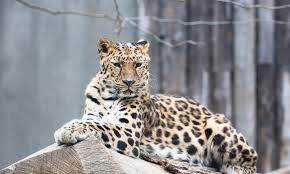

In [7]:
img, image_class = random_image_display()
img

### Using Matplotlib
We create a numpy array of using the random image created using the `random_image_display` function.

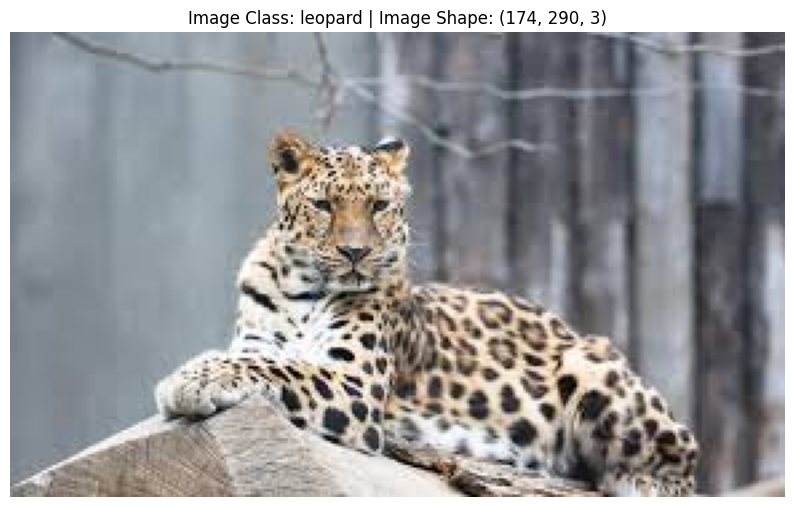

In [8]:
img_as_arr = np.asarray(img)

plt.figure(figsize=(10, 7))
plt.imshow(img_as_arr)
plt.title(f"Image Class: {image_class} | Image Shape: {img_as_arr.shape}")
plt.axis(False);

# Setting up device agnostic code
We are setting up the device agnostic code, which will allow us to use the GPU if they are available

In [9]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

We are using a terminal command `!nvidia-smi` to display the GPU specifications.

In [10]:
!nvidia-smi

Wed Mar  6 14:36:10 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0              26W / 250W |      2MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Setting up helper functions
In this Section which create some helper functions which will help us in our tasks.


#### Fuction to Create Dataloaders
In this sub-section we define a function to create data loaders for different folds 

In [11]:
def create_dataloaders(dataset, n_splits=3, batch_size=16):
    train_dataloaders = []
    test_dataloaders = []
    
    kfold = KFold(n_splits=n_splits, shuffle=True)
    
    for fold, (train_ids, test_ids) in enumerate(kfold.split(dataset)):
        train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
        train_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=train_subsampler, pin_memory=True, num_workers=os.cpu_count())
        test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
        test_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=test_subsampler, pin_memory=True, num_workers=os.cpu_count())
        train_dataloaders.append(train_dataloader)
        test_dataloaders.append(test_dataloader)
    return train_dataloaders, test_dataloaders

In [13]:
def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device=device):
    model.train()

    train_loss, train_acc = 0, 0
    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)

        y_pred = model(X)

        loss = loss_fn(y_pred, y)
        train_loss += loss.item()
        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)

        train_acc += (y_pred_class == y).sum().item() / len(y_pred)


    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)

    return train_loss, train_acc

In [23]:
def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device=device):

    model.eval()

    test_loss, test_acc = 0, 0
    labels, predictions = [], []
    with torch.inference_mode():
        for batch, (X, y) in enumerate(dataloader):
            X, y = X.to(device), y.to(device)

            test_pred_logits = model(X)
            loss = loss_fn(test_pred_logits, y)

            test_loss += loss.item()

            test_pred_labels = test_pred_logits.argmax(dim=1)

            test_acc += ((test_pred_labels == y).sum().item() / len(test_pred_labels))
            
            labels.extend(y.cpu().numpy())
            predictions.extend(test_pred_labels.cpu().numpy())
    test_loss = test_loss / len(dataloader)

    test_acc = test_acc / len(dataloader)

    return test_loss, test_acc, labels, predictions

In [24]:
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5,
          device=device):

    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []}

    for epoch in range(epochs):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer,
                                           device=device)

        test_loss, test_acc, labels, predictions = test_step(model=model,
                                                             dataloader=test_dataloader,
                                                             loss_fn=loss_fn,
                                                             device=device)


        print(f"Epoch: {epoch} | Train loss: {train_loss:.4f} | Train acc: {train_acc:.4f} | Test loss: {test_loss:.4f} | Test acc: {test_acc:.4f}")

        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)        
    return results, labels, predictions

In [25]:
def save_loss_curves_ovr(results):
    folder_dir = "/kaggle/working/OnevsRestPrediction"
    directory = os.path.join(folder_dir,f"results_{results['One Label']}")
    os.makedirs(directory, exist_ok=True)
    for fold in results['results']:
        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=100)
        axs[0].plot(results['results'][fold]['train_loss'], label='Train Loss', color='red')
        axs[0].plot(results['results'][fold]['test_loss'], label='Test Loss', color='blue')
        axs[0].set_title(f"Loss Curve for Dataset: {results['One Label']} for Fold: {fold+1}")
        axs[0].set_xlabel("Epoch")
        axs[0].set_ylabel("Loss")
        axs[0].legend()
        axs[1].plot(results['results'][fold]['train_acc'], label='Train Accuracy', color='red')
        axs[1].plot(results['results'][fold]['test_acc'], label='Test Accuracy', color='blue')
        axs[1].set_title(f"Accuracy Curve for Dataset: {results['One Label']} for Fold: {fold+1}")
        axs[1].set_xlabel("Epoch")
        axs[1].set_ylabel("Loss")
        axs[1].legend()
        plt.savefig(os.path.join(directory, f'{fold+1}.png'))

In [26]:
def save_loss_curves_5class(results, filename):
    folder_dir = "/kaggle/working/fiveclass_Prediction"
    directory = os.path.join(folder_dir,filename)
    os.makedirs(directory, exist_ok=True)
    for fold in results['results']:
        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=100)
        axs[0].plot(results['results'][fold]['train_loss'], label='Train Loss', color='red')
        axs[0].plot(results['results'][fold]['test_loss'], label='Test Loss', color='blue')
        axs[0].set_title(f"Loss Curve for Dataset: {filename} for Fold: {fold+1}")
        axs[0].set_xlabel("Epoch")
        axs[0].set_ylabel("Loss")
        axs[0].legend()
        axs[1].plot(results['results'][fold]['train_acc'], label='Train Accuracy', color='red')
        axs[1].plot(results['results'][fold]['test_acc'], label='Test Accuracy', color='blue')
        axs[1].set_title(f"Accuracy Curve for Dataset: {filename} for Fold: {fold+1}")
        axs[1].set_xlabel("Epoch")
        axs[1].set_ylabel("Loss")
        axs[1].legend()
        plt.savefig(os.path.join(directory, f'{fold+1}.png'))

# One Vs Rest Classification

## Creating a Custom Dataset for one vs rest classification

In [27]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, 
                 data_dir_path: str,
                 one_idx: int, 
                 transforms=None):
        class_names = os.listdir(data_dir_path)
        one_class_name = class_names[one_idx]
        self.transforms = transforms
        self.images = []
        self.labels = []
        
        for class_name in class_names:
            if class_name == one_class_name:
                img_percent = 1
            else:
                img_percent = 0.1
                
            folder_path = os.path.join(data_dir_path, class_name)
            for i, img_id in enumerate(os.listdir(folder_path)):
                if i >= img_percent*len(os.listdir(folder_path)):
                    break
                img_path = os.path.join(folder_path, img_id)
                self.images.append(os.path.join(folder_path, img_id))
                if class_name == one_class_name:
                    self.labels.append(1)
                else:
                    self.labels.append(0)
    
    def load_image(self, index:int):
        return Image.open(self.images[index])
        
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index:int):
        img = self.load_image(index)
        label = self.labels[index]
        if self.transforms != None:
            return self.transforms(img), torch.tensor(label, dtype=torch.long)
        return img, label

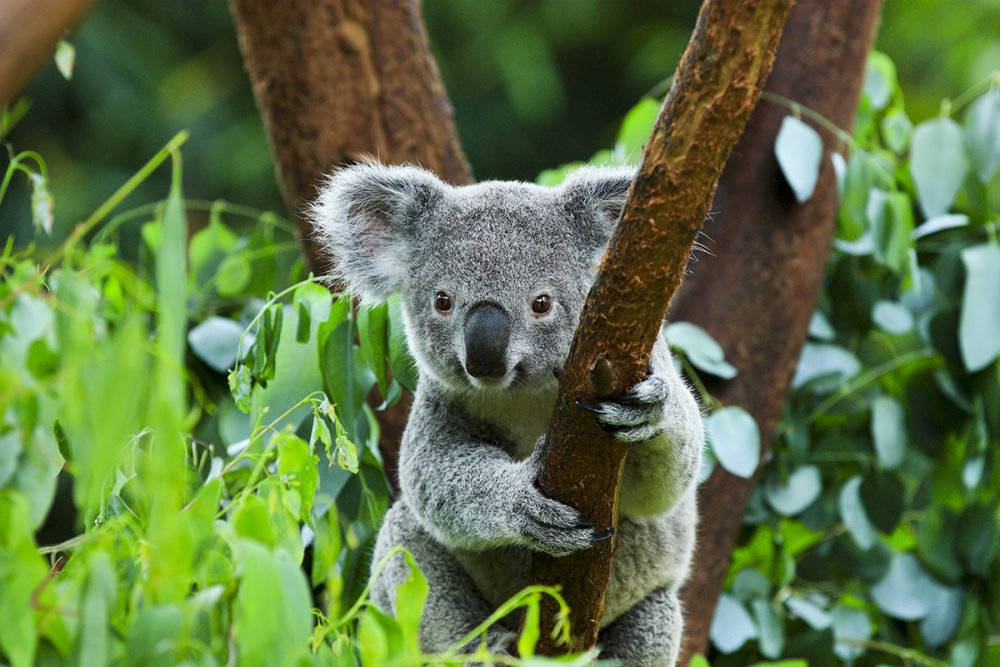

In [28]:
ovrdataset = CustomDataset(data_dir_path=data_dir, one_idx=10)
ovrdataset.load_image(random.choice(range(0, len(ovrdataset))))

## Creating the Classification Function

In [31]:
def one_vs_rest_classification(data_dir, index, model, model_name, device, transforms, optimizer, loss_function, epochs=3, n_splits=3, batch_size=16):
    one_vs_rest_results = {}
    print("One Label: ", os.listdir(data_dir)[index])
    dataset = CustomDataset(data_dir, index, transforms)
    train_dataloaders, test_dataloaders = create_dataloaders(dataset, n_splits, batch_size)
    each_fold_results = {}
    for fold in range(n_splits):
        train_dataloader = train_dataloaders[fold]
        test_dataloader = test_dataloaders[fold]
            
        model.to(device)
            
        results, labels, predictions = train(model,
                                             train_dataloader,
                                             test_dataloader,
                                             optimizer=optimizer,
                                             loss_fn=loss_function,
                                             epochs=epochs,
                                             device=device)
        each_fold_results[fold] = results
        print(f"For Fold - {fold+1}")
        print(confusion_matrix(labels, predictions))
        
    
    one_vs_rest_results["Model"] = model_name
    one_vs_rest_results["One Label"] = os.listdir(data_dir)[index]
    one_vs_rest_results["results"] = each_fold_results
    
    return one_vs_rest_results

## Getting a Pre-trained Model

In [32]:
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT

pretrained_vit = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(device)

for parameter in pretrained_vit.parameters():
    parameter.requires_grad = False

torch.manual_seed(42)
torch.cuda.manual_seed(42)
pretrained_vit.heads = nn.Linear(in_features=768,
                                 out_features=2).to(device)

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:04<00:00, 72.4MB/s] 


In [33]:
summary(model=pretrained_vit,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [32, 3, 224, 224]    [32, 2]              768                  Partial
├─Conv2d (conv_proj)                                         [32, 3, 224, 224]    [32, 768, 14, 14]    (590,592)            False
├─Encoder (encoder)                                          [32, 197, 768]       [32, 197, 768]       151,296              False
│    └─Dropout (dropout)                                     [32, 197, 768]       [32, 197, 768]       --                   --
│    └─Sequential (layers)                                   [32, 197, 768]       [32, 197, 768]       --                   False
│    │    └─EncoderBlock (encoder_layer_0)                   [32, 197, 768]       [32, 197, 768]       (7,087,872)          False
│    │    └─EncoderBlock (encoder_layer_1)                   [32, 197, 768]       [32, 

## Creating Transforms, Loss function and Optimizers

In [34]:
ovr_transforms = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            ])

In [35]:
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=pretrained_vit.parameters(),
                             lr=3e-3,
                             betas=(0.9, 0.999),
                             weight_decay=0.3)

## Running the model and saving the loss curves

In [120]:
index = random.choice(range(90))
ovr_results = one_vs_rest_classification(data_dir, index, pretrained_vit,'Pretrained ViT', device, ovr_transforms, optimizer, loss_function, epochs=3, n_splits=3)

One Label:  woodpecker
Epoch: 0 | Train loss: 0.1637 | Train acc: 0.9525 | Test loss: 0.0850 | Test acc: 0.9760
Epoch: 1 | Train loss: 0.0635 | Train acc: 0.9892 | Test loss: 0.1102 | Test acc: 0.9856
Epoch: 2 | Train loss: 0.0772 | Train acc: 0.9950 | Test loss: 0.0913 | Test acc: 0.9712
For Fold - 1
[[183   2]
 [  4   9]]
Epoch: 0 | Train loss: 0.0969 | Train acc: 0.9717 | Test loss: 0.0800 | Test acc: 0.9712
Epoch: 1 | Train loss: 0.0801 | Train acc: 0.9850 | Test loss: 0.0870 | Test acc: 0.9856
Epoch: 2 | Train loss: 0.0760 | Train acc: 0.9900 | Test loss: 0.0860 | Test acc: 0.9904
For Fold - 2
[[174   1]
 [  1  22]]
Epoch: 0 | Train loss: 0.0772 | Train acc: 0.9825 | Test loss: 0.1397 | Test acc: 0.9375
Epoch: 1 | Train loss: 0.0828 | Train acc: 0.9817 | Test loss: 0.0997 | Test acc: 0.9728
Epoch: 2 | Train loss: 0.0775 | Train acc: 0.9875 | Test loss: 0.0987 | Test acc: 0.9728
For Fold - 3
[[173   1]
 [  3  21]]


In [121]:
ovr_results

{'Model': 'Pretrained ViT',
 'One Label': 'woodpecker',
 'results': {0: {'train_loss': [0.16367236185818912,
    0.06353715792298317,
    0.07718641981482506],
   'train_acc': [0.9525, 0.9891666666666667, 0.995],
   'test_loss': [0.084987103795776, 0.11023739639383096, 0.09134484741550225],
   'test_acc': [0.9759615384615384, 0.9855769230769231, 0.9711538461538461]},
  1: {'train_loss': [0.09688194684684276,
    0.08007445625960827,
    0.0760013371706009],
   'train_acc': [0.9716666666666667, 0.985, 0.99],
   'test_loss': [0.07998299784958363,
    0.08703638756504425,
    0.08597321177904423],
   'test_acc': [0.9711538461538461, 0.9855769230769231, 0.9903846153846154]},
  2: {'train_loss': [0.07717134982347489,
    0.08282378733158112,
    0.07751185461878776],
   'train_acc': [0.9825, 0.9816666666666667, 0.9875],
   'test_loss': [0.13969579274551228,
    0.09965650565349139,
    0.09866789900339566],
   'test_acc': [0.9375, 0.9727564102564104, 0.9727564102564104]}}}

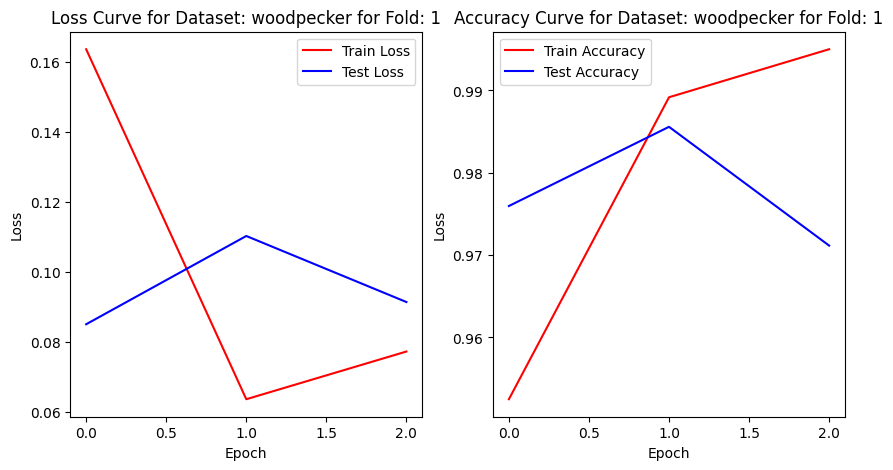

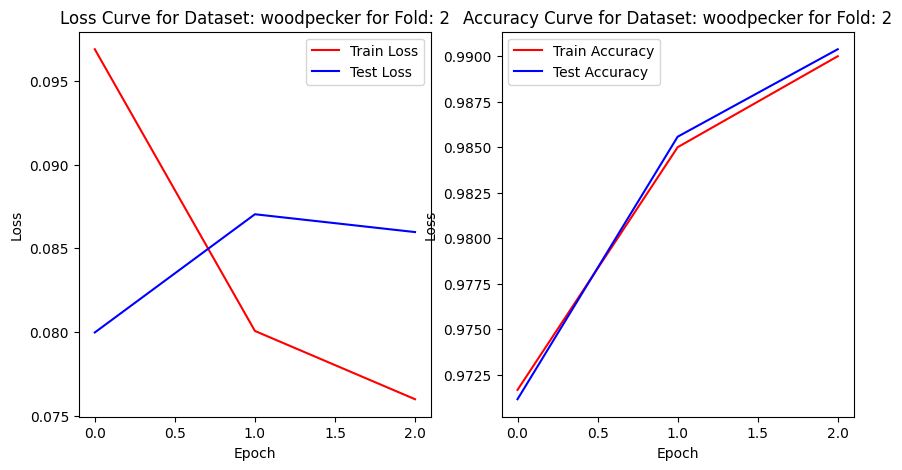

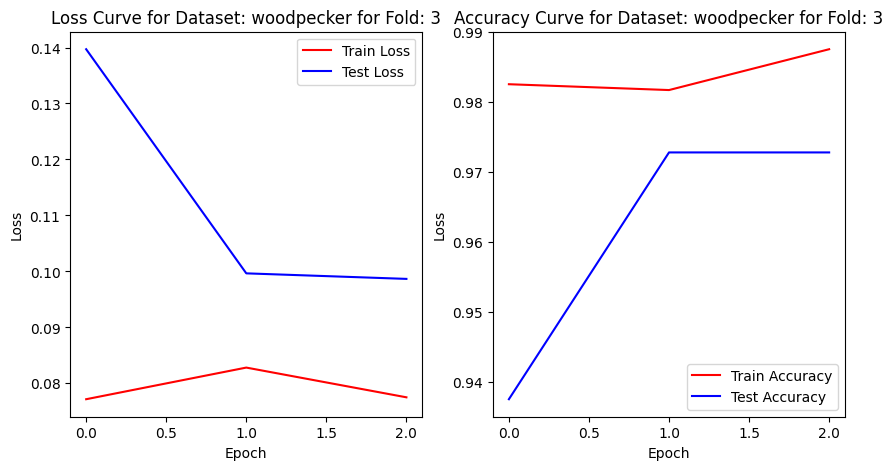

In [122]:
save_loss_curves_ovr(ovr_results)

# 5-class Classification

## Creating a Custom Dataset for 5 class classification

In [101]:
class CustomDataset_5class(torch.utils.data.Dataset):
    def __init__(self, 
                 data_dir_path: str,
                 list_idxs, 
                 transforms=None):
        class_names = os.listdir(data_dir_path)
        group_class_names = [class_names[i] for i in list_idxs]
        self.transforms = transforms
        self.images = []
        self.labels = []
        
        for class_name in class_names:
            if class_name in group_class_names:
                img_percent = 1
            else:
                img_percent = 0.1
                
            folder_path = os.path.join(data_dir_path, class_name)
            for i, img_id in enumerate(os.listdir(folder_path)):
                if i >= img_percent*len(os.listdir(folder_path)):
                    break
                img_path = os.path.join(folder_path, img_id)
                self.images.append(os.path.join(folder_path, img_id))
                if class_name in group_class_names:
                    for lb in range(len(list_idxs)):
                        if (class_name == group_class_names[lb]):
                            self.labels.append(lb+1)
                else:
                    self.labels.append(0)
    
    def load_image(self, index:int):
        return Image.open(self.images[index])
        
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index:int):
        img = self.load_image(index)
        label = self.labels[index]
        if self.transforms:
            return self.transforms(img), torch.tensor(label, dtype=torch.long)
        return img, label

In [102]:
fivec_dataset = CustomDataset_5class(data_dir, [2, 4, 6, 8])

## Creating the classification funtion

In [103]:
def five_class_classification(data_dir, list_idxs, model, model_name, device, transforms, optimizer, loss_function, epochs=3, n_splits=3, batch_size=16):
    five_class_results = {}
    print("Group Classes: ", [os.listdir(data_dir)[i] for i in list_idxs])
    dataset = CustomDataset_5class(data_dir, list_idxs, transforms)
    train_dataloaders, test_dataloaders = create_dataloaders(dataset, n_splits, batch_size)
    each_fold_results = {}
    for fold in range(n_splits):
        print(f'For Fold: {fold+1} \n')
        train_dataloader = train_dataloaders[fold]
        test_dataloader = test_dataloaders[fold]
            
        model.to(device)
            
        results, labels, predictions = train(model,
                                             train_dataloader,
                                             test_dataloader,
                                             optimizer=optimizer,
                                             loss_fn=loss_function,
                                             epochs=epochs,
                                             device=device)
        each_fold_results[fold] = results
        print(f"For Fold - {fold+1}")
        print(confusion_matrix(labels, predictions))
        
    
    five_class_results["Model"] = model_name
    five_class_results["Group Classes"] = [os.listdir(data_dir)[i] for i in list_idxs]
    five_class_results["results"] = each_fold_results
    
    return five_class_results

## Getting a Pre-trained Model

In [123]:
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT

pretrained_vit = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(device)

for parameter in pretrained_vit.parameters():
    parameter.requires_grad = False

torch.manual_seed(42)
torch.cuda.manual_seed(42)
pretrained_vit.heads = nn.Linear(in_features=768,
                                 out_features=5).to(device)

## Setting up tranforms, loss-function and optimizers

In [124]:
fivec_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

In [125]:
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=pretrained_vit.parameters(),
                             lr=3e-3,
                             betas=(0.9, 0.999),
                             weight_decay=0.3)

In [126]:
list_idxs = [2, 4, 6, 8]
five_class_results = five_class_classification(data_dir, list_idxs, pretrained_vit, "Pretrained ViT", device, fivec_transforms, optimizer, loss_function)

Group Classes:  ['fox', 'hedgehog', 'snake', 'horse']
For Fold: 1 

Epoch: 0 | Train loss: 0.5586 | Train acc: 0.8496 | Test loss: 0.2662 | Test acc: 0.9440
Epoch: 1 | Train loss: 0.2160 | Train acc: 0.9629 | Test loss: 0.2806 | Test acc: 0.9375
Epoch: 2 | Train loss: 0.2283 | Train acc: 0.9648 | Test loss: 0.2643 | Test acc: 0.9518
For Fold - 1
[[162   1   2   0   1]
 [  4  20   0   0   0]
 [  1   0  21   0   0]
 [  1   0   0  21   0]
 [  2   0   0   0  16]]
For Fold: 2 

Epoch: 0 | Train loss: 0.2433 | Train acc: 0.9473 | Test loss: 0.2250 | Test acc: 0.9688
Epoch: 1 | Train loss: 0.2160 | Train acc: 0.9609 | Test loss: 0.2351 | Test acc: 0.9688
Epoch: 2 | Train loss: 0.2198 | Train acc: 0.9746 | Test loss: 0.2310 | Test acc: 0.9453
For Fold - 2
[[172   2   1   0   0]
 [  0  20   0   0   0]
 [  1   0  18   0   0]
 [  2   0   0  13   0]
 [  8   0   0   0  15]]
For Fold: 3 

Epoch: 0 | Train loss: 0.2419 | Train acc: 0.9453 | Test loss: 0.2684 | Test acc: 0.9414
Epoch: 1 | Train loss: 

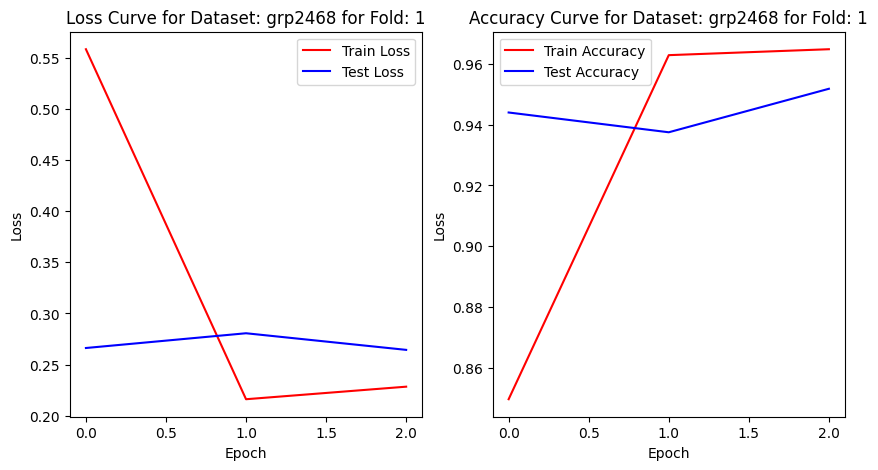

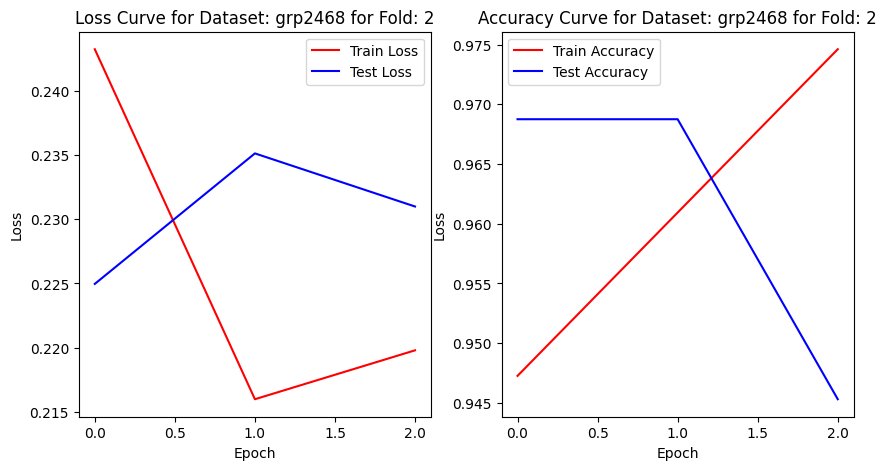

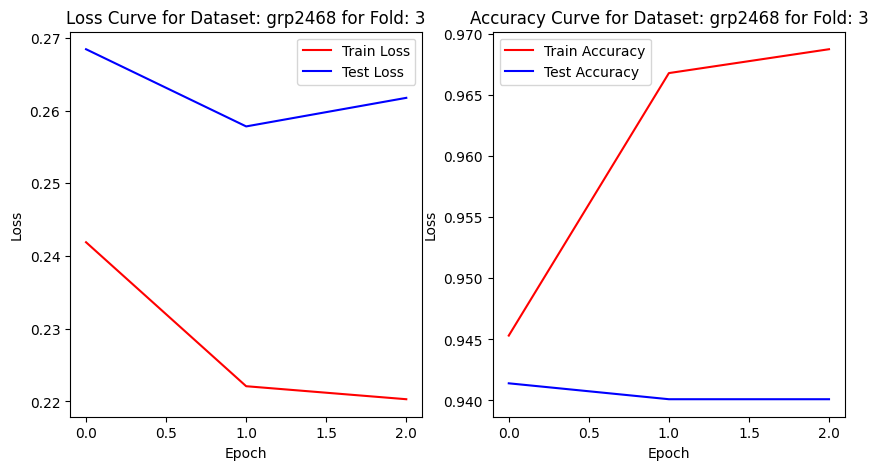

In [127]:
save_loss_curves_5class(five_class_results, "grp2468")

# Custom Model for Classification

In [86]:
class CustomModel(nn.Module):
    def __init__(self, noc:int):
        super().__init__()
        self.convblock1 = nn.Sequential(
            nn.Conv2d(in_channels=3,
                      out_channels=16,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3)
        )
        self.convblock2 = nn.Sequential(
            nn.Conv2d(in_channels=16,
                      out_channels=32,
                      kernel_size=2,
                      stride=1,
                      padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3)
        )
        self.convblock3 = nn.Sequential(
            nn.Conv2d(in_channels=32,
                      out_channels=64,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=9216,
                      out_features=1000),
            nn.ReLU(),
            nn.Linear(in_features=1000,
                      out_features=noc)
        )
        
    def forward(self, x):
        x = self.convblock1(x)
#         print(x.shape)
        x = self.convblock2(x)
#         print(x.shape)
        x = self.convblock3(x)
#         print(x.shape)
        x = self.classifier(x)
        return x

## For One Vs Rest Classification

### Creating the Model

In [87]:
ovr_custom_model = CustomModel(noc=2)

In [88]:
ovr_custom_model.to(device)

CustomModel(
  (convblock1): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (convblock2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(2, 2), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (convblock3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=92

In [89]:
ovr_custom_model(ovr_transforms(ovrdataset.load_image(32)).unsqueeze(0).to(device))

tensor([[-0.0140,  0.1304]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [90]:
summary(model=ovr_custom_model,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
CustomModel (CustomModel)                [32, 3, 224, 224]    [32, 2]              --                   True
├─Sequential (convblock1)                [32, 3, 224, 224]    [32, 16, 74, 74]     --                   True
│    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 16, 224, 224]   448                  True
│    └─BatchNorm2d (1)                   [32, 16, 224, 224]   [32, 16, 224, 224]   32                   True
│    └─ReLU (2)                          [32, 16, 224, 224]   [32, 16, 224, 224]   --                   --
│    └─MaxPool2d (3)                     [32, 16, 224, 224]   [32, 16, 74, 74]     --                   --
├─Sequential (convblock2)                [32, 16, 74, 74]     [32, 32, 25, 25]     --                   True
│    └─Conv2d (0)                        [32, 16, 74, 74]     [32, 32, 75, 75]     2,080                True
│    └─BatchNorm2d

### Setting up transforms, loss_function and optimizer

In [91]:
ovr_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

In [92]:
loss_function = torch.nn.CrossEntropyLoss()
custom_optimizer_ovr = torch.optim.SGD(params=ovr_custom_model.parameters(),
                            lr=0.1)

### Running the Model

In [129]:
index = random.choice(range(90))
ovr_custom_results = one_vs_rest_classification(data_dir, index, ovr_custom_model,'Custom Model', device, ovr_transforms, custom_optimizer_ovr, loss_function, epochs=10, n_splits=3)

One Label:  dolphin
Epoch: 0 | Train loss: 0.2721 | Train acc: 0.9000 | Test loss: 0.3270 | Test acc: 0.8750
Epoch: 1 | Train loss: 0.1335 | Train acc: 0.9225 | Test loss: 0.2997 | Test acc: 0.9183
Epoch: 2 | Train loss: 0.1067 | Train acc: 0.9500 | Test loss: 0.4101 | Test acc: 0.8734
Epoch: 3 | Train loss: 0.1745 | Train acc: 0.9367 | Test loss: 1.1530 | Test acc: 0.5369
Epoch: 4 | Train loss: 0.1791 | Train acc: 0.9175 | Test loss: 0.3049 | Test acc: 0.8798
Epoch: 5 | Train loss: 0.1398 | Train acc: 0.9317 | Test loss: 0.2567 | Test acc: 0.8718
Epoch: 6 | Train loss: 0.0957 | Train acc: 0.9542 | Test loss: 0.3479 | Test acc: 0.8990
Epoch: 7 | Train loss: 0.0838 | Train acc: 0.9575 | Test loss: 0.3849 | Test acc: 0.9199
Epoch: 8 | Train loss: 0.0674 | Train acc: 0.9692 | Test loss: 0.3302 | Test acc: 0.9038
Epoch: 9 | Train loss: 0.0650 | Train acc: 0.9750 | Test loss: 0.3167 | Test acc: 0.9183
For Fold - 1
[[165   8]
 [  9  16]]
Epoch: 0 | Train loss: 0.2376 | Train acc: 0.9083 | Te

In [ ]:
sav

## For 5-class Classification

### Creating the Model

In [95]:
fivec_custom_model = CustomModel(noc=5)
fivec_custom_model.to(device)

CustomModel(
  (convblock1): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (convblock2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(2, 2), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (convblock3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=92

In [96]:
summary(model=fivec_custom_model,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
CustomModel (CustomModel)                [32, 3, 224, 224]    [32, 5]              --                   True
├─Sequential (convblock1)                [32, 3, 224, 224]    [32, 16, 74, 74]     --                   True
│    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 16, 224, 224]   448                  True
│    └─BatchNorm2d (1)                   [32, 16, 224, 224]   [32, 16, 224, 224]   32                   True
│    └─ReLU (2)                          [32, 16, 224, 224]   [32, 16, 224, 224]   --                   --
│    └─MaxPool2d (3)                     [32, 16, 224, 224]   [32, 16, 74, 74]     --                   --
├─Sequential (convblock2)                [32, 16, 74, 74]     [32, 32, 25, 25]     --                   True
│    └─Conv2d (0)                        [32, 16, 74, 74]     [32, 32, 75, 75]     2,080                True
│    └─BatchNorm2d

### Setting up transforms, loss function and optimizers

In [97]:
fivec_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])

In [99]:
fivec_loss_function = torch.nn.CrossEntropyLoss()
custom_optimizer_fivec = torch.optim.SGD(params=fivec_custom_model.parameters(),
                            lr=0.1)

### Running the model

In [132]:
list_idxs = [2, 4, 6, 8]
five_class_custom_results = five_class_classification(data_dir, list_idxs, fivec_custom_model, "Custom Model", device, fivec_transforms, custom_optimizer_fivec, fivec_loss_function, epochs=10)

Group Classes:  ['fox', 'hedgehog', 'snake', 'horse']
For Fold: 1 

Epoch: 0 | Train loss: 0.0015 | Train acc: 1.0000 | Test loss: 0.0009 | Test acc: 1.0000
Epoch: 1 | Train loss: 0.0020 | Train acc: 1.0000 | Test loss: 0.0008 | Test acc: 1.0000
Epoch: 2 | Train loss: 0.0019 | Train acc: 1.0000 | Test loss: 0.0007 | Test acc: 1.0000
Epoch: 3 | Train loss: 0.0021 | Train acc: 1.0000 | Test loss: 0.0007 | Test acc: 1.0000
Epoch: 4 | Train loss: 0.0019 | Train acc: 1.0000 | Test loss: 0.0006 | Test acc: 1.0000
Epoch: 5 | Train loss: 0.0011 | Train acc: 1.0000 | Test loss: 0.0008 | Test acc: 1.0000
Epoch: 6 | Train loss: 0.0007 | Train acc: 1.0000 | Test loss: 0.0007 | Test acc: 1.0000
Epoch: 7 | Train loss: 0.0005 | Train acc: 1.0000 | Test loss: 0.0006 | Test acc: 1.0000
Epoch: 8 | Train loss: 0.0009 | Train acc: 1.0000 | Test loss: 0.0006 | Test acc: 1.0000
Epoch: 9 | Train loss: 0.0016 | Train acc: 1.0000 | Test loss: 0.0011 | Test acc: 1.0000
For Fold - 1
[[176   0   0   0   0]
 [  0 

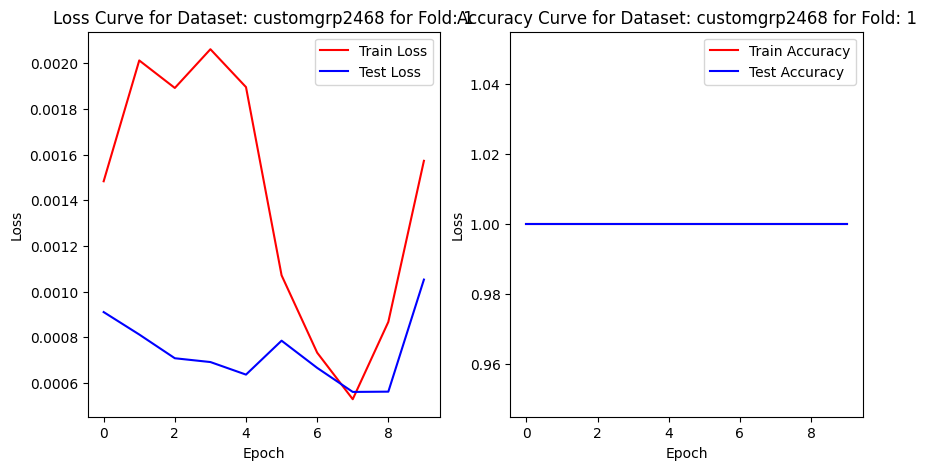

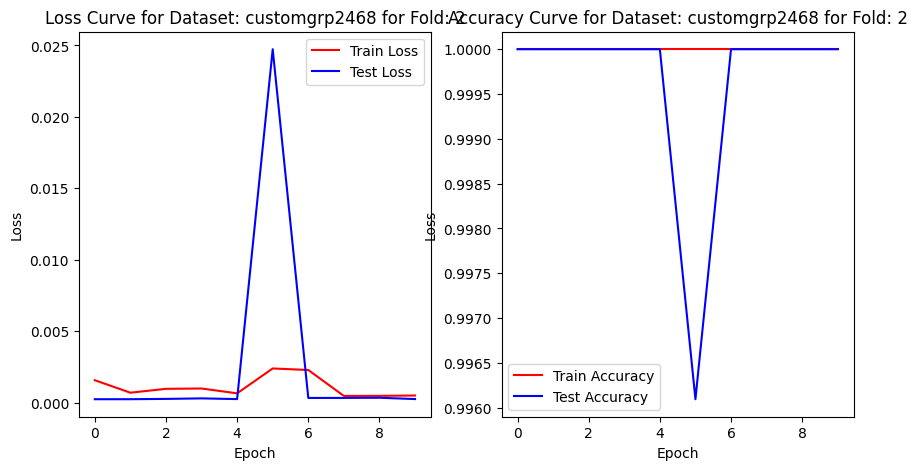

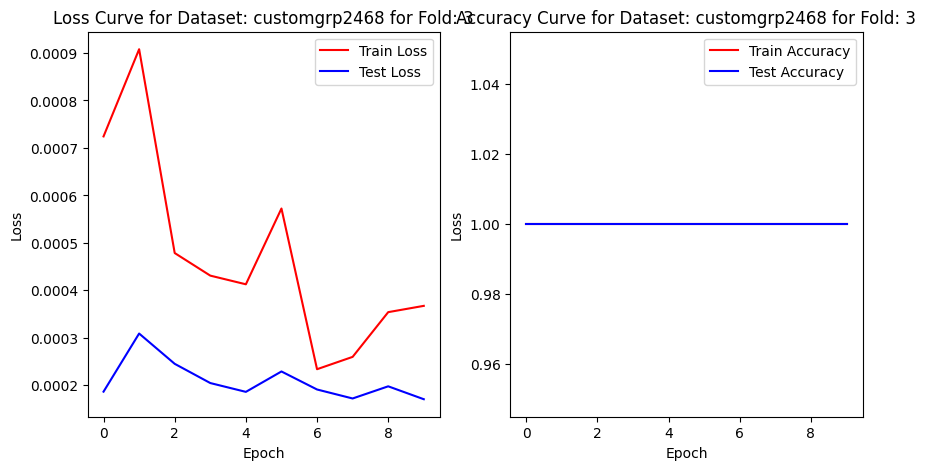

In [133]:
save_loss_curves_5class(five_class_custom_results, 'customgrp2468')

# Visualizing Feature maps of Custom Model

In [114]:
def visualizing_feature_maps(model, img, transforms, device):
    no_of_layers = 0
    conv_layers = []
    outputs = []
    model_children = list(model.children())
    for child in model_children:
        if type(child) == nn.Sequential:
            for layer in child.children():
                if type(layer) == nn.Conv2d:
                    no_of_layers += 1
                    conv_layers.append(layer)
    
    vis_img = transforms(img).unsqueeze(0).to(device)
    
    outputs.append(conv_layers[0](vis_img))
    for i in range(1, len(conv_layers)):
        outputs.append(conv_layers[i](outputs[-1]))
    
    for num_layer in range(len(outputs)):
        plt.figure(figsize=(50, 10))
        layer_vis = outputs[num_layer].squeeze()
        print("Layer ", num_layer+1)
        for i, f in enumerate(layer_vis):
            plt.subplot(8, 8, i+1)
            plt.imshow(f.detach().cpu().numpy())
            plt.axis("off")
    
        plt.show()
        
    return outputs, conv_layers

Layer  1


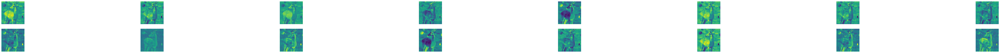

Layer  2


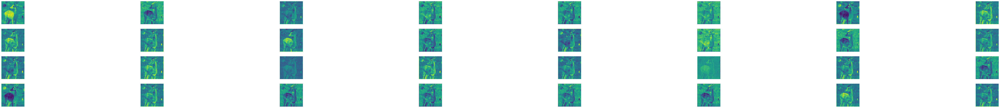

Layer  3


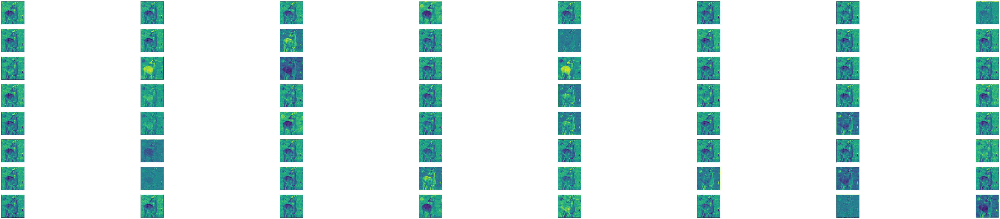

In [128]:
ovr_outputs, ovr_conv_layers = visualizing_feature_maps(ovr_custom_model, ovrdataset.load_image(56), ovr_transforms, device)

Layer  1


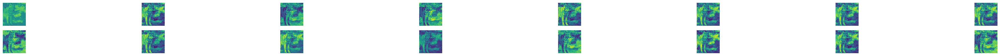

Layer  2


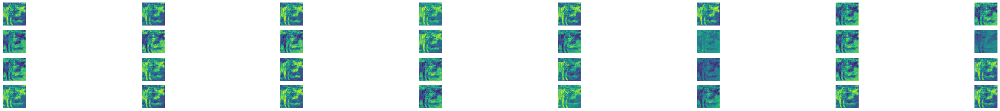

Layer  3


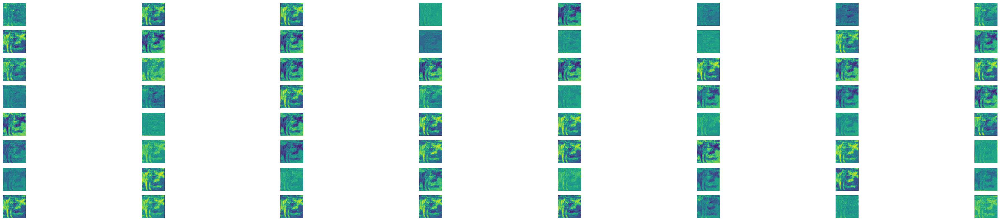

In [108]:
fivec_outputs, fivec_conv_layers = visualizing_feature_maps(fivec_custom_model, fivec_dataset.load_image(74), fivec_transforms, device)